In [27]:
import os
import random
import shutil
import csv
import cv2
import itertools
import numpy as np
import pandas as pd
import sys
import tempfile
import tqdm
import time

from matplotlib import pyplot as plt
from matplotlib.collections import LineCollection

import tensorflow as tf
import tensorflow_hub as hub
from tensorflow import keras
from PIL import Image
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix

In [28]:
pose_sample_rpi_path = os.path.join(
    os.getcwd(), "examples/lite/examples/pose_estimation/raspberry_pi"
)


sys.path.append(pose_sample_rpi_path)

In [29]:
import utils
from data import BodyPart
from ml import Movenet

movenet = Movenet("movenet_thunder")

In [30]:
def detect(input_tensor, inference_count=3):
    """Runs detection on an input image.
    Args:
      input_tensor: A [height, width, 3] Tensor of type tf.float32.
        Note that height and width can be anything since the image will be
        immediately resized according to the needs of the model within this
        function.
      inference_count: Number of times the model should run repeatly on the
        same input image to improve detection accuracy.

    Returns:
      A Person entity detected
    """
    channel, image_height, image_width = input_tensor.shape

    # Detect pose using the full input image
    movenet.detect(input_tensor.numpy(), reset_crop_region=True)

    # Repeatedly using previous detection result to identify the region of
    # interest and only croping that region to improve detection accuracy
    for _ in range(inference_count - 1):
        person = movenet.detect(input_tensor.numpy(), reset_crop_region=False)

    return person

In [31]:
def draw_prediction_on_image(
    image, person, crop_region=None, close_figure=True, keep_input_size=False
):
    """Draws the keypoint predictions on image.

    Args:
      image: An numpy array with shape [height, width, channel] representing the
        pixel values of the input image.
      person: A person entity returned from the MoveNet.SinglePose model.
      close_figure: Whether to close the plt figure after the function returns.
      keep_input_size: Whether to keep the size of the input image.

    Returns:
      An numpy array with shape [out_height, out_width, channel] representing the
      image overlaid with keypoint predictions.
    """
    # Draw the detection result on top of the image.
    image_np = utils.visualize(image, [person])

    # Plot the image with detection results.
    height, width, channel = image.shape
    aspect_ratio = float(width) / height
    fig, ax = plt.subplots(figsize=(12 * aspect_ratio, 12))
    im = ax.imshow(image_np)

    if close_figure:
        plt.close(fig)

    if not keep_input_size:
        image_np = utils.keep_aspect_ratio_resizer(image_np, (512, 512))

    return image_np

In [32]:
class MoveNetPreprocessor(object):
    """Helper class to preprocess pose sample images for classification."""

    def __init__(self, images_in_folder, images_out_folder, csvs_out_path):

        self._images_in_folder = images_in_folder
        self._images_out_folder = images_out_folder
        self._csvs_out_path = csvs_out_path
        self._messages = []

        # Create a temp dir to store the pose CSVs per class
        self._csvs_out_folder_per_class = tempfile.mkdtemp()

        # Get list of pose classes and print image statistics
        self._pose_class_names = sorted(
            [n for n in os.listdir(self._images_in_folder) if not n.startswith(".")]
        )

    def detectFaces(self, face_cascade, image, flipped):
        gray = cv2.cvtColor(image.numpy(), cv2.COLOR_BGR2GRAY)
        faces = face_cascade.detectMultiScale(gray, 1.1, 4)
        if flipped:
            if len(faces) == 0:
                return 1
            return 0
        else:
            if len(faces) == 0:
                return 0
            return 1

    # def detectFaces(self,face_cascade,image):
    #   gray = cv2.cvtColor(image.numpy(), cv2.COLOR_BGR2GRAY)
    #   faces = face_cascade.detectMultiScale(gray, 1.1, 4)
    #   if(len(faces)==0):
    #     return 0
    #   return 1

    def process(self, per_pose_class_limit=None, detection_threshold=0.1):
        """Preprocesses images in the given folder.
        Args:
          per_pose_class_limit: Number of images to load. As preprocessing usually
            takes time, this parameter can be specified to make the reduce of the
            dataset for testing.
          detection_threshold: Only keep images with all landmark confidence score
            above this threshold.
        """
        # Loop through the classes and preprocess its images
        for pose_class_name in self._pose_class_names:
            print("Preprocessing", pose_class_name, file=sys.stderr)

            # Paths for the pose class.
            images_in_folder = os.path.join(self._images_in_folder, pose_class_name)
            images_out_folder = os.path.join(self._images_out_folder, pose_class_name)
            csv_out_path = os.path.join(
                self._csvs_out_folder_per_class, pose_class_name + ".csv"
            )
            if not os.path.exists(images_out_folder):
                os.makedirs(images_out_folder)

            # Detect landmarks in each image and write it to a CSV file
            with open(csv_out_path, "w") as csv_out_file:
                csv_out_writer = csv.writer(
                    csv_out_file, delimiter=",", quoting=csv.QUOTE_MINIMAL
                )
                # Get list of images
                image_names = sorted(
                    [n for n in os.listdir(images_in_folder) if not n.startswith(".")]
                )
                if per_pose_class_limit is not None:
                    image_names = image_names[:per_pose_class_limit]

                valid_image_count = 0

                # Detect pose landmarks from each image
                for image_name in tqdm.tqdm(image_names):
                    try:
                        image_path = os.path.join(images_in_folder, image_name)

                        try:
                            image = tf.io.read_file(image_path)
                            image = tf.io.decode_jpeg(image)
                        except:
                            self._messages.append(
                                "Skipped " + image_path + ". Invalid image."
                            )
                            continue
                        else:
                            image = tf.io.read_file(image_path)
                            image = tf.io.decode_jpeg(image)
                            image_height, image_width, channel = image.shape

                        # Skip images that isn't RGB because Movenet requires RGB images
                        if channel != 3:
                            self._messages.append(
                                "Skipped " + image_path + ". Image isn't in RGB format."
                            )
                            continue
                        person = detect(image)
                        # faces = self.detectFaces(face_cascade,image,flipped)
                        # Save landmarks if all landmarks were detected
                        min_landmark_score = min(
                            [keypoint.score for keypoint in person.keypoints]
                        )
                        should_keep_image = min_landmark_score >= detection_threshold
                        if not should_keep_image:
                            self._messages.append(
                                "Skipped "
                                + image_path
                                + ". No pose was confidentlly detected."
                            )
                            continue

                        valid_image_count += 1

                        # Draw the prediction result on top of the image for debugging later
                        output_overlay = draw_prediction_on_image(
                            image.numpy().astype(np.uint8),
                            person,
                            close_figure=True,
                            keep_input_size=True,
                        )

                        # Write detection result into an image file
                        output_frame = cv2.cvtColor(output_overlay, cv2.COLOR_RGB2BGR)
                        cv2.imwrite(
                            os.path.join(images_out_folder, image_name), output_frame
                        )

                        # Get landmarks and scale it to the same size as the input image
                        pose_landmarks = np.array(
                            [
                                [
                                    keypoint.coordinate.x,
                                    keypoint.coordinate.y,
                                    keypoint.score,
                                ]
                                for keypoint in person.keypoints
                            ],
                            dtype=np.float32,
                        )

                        # Write the landmark coordinates to its per-class CSV file
                        coordinates = pose_landmarks.flatten().astype(str).tolist()
                        # coordinates = pose_landmarks.flatten().astype(np.str).tolist()
                        csv_out_writer.writerow([image_name] + coordinates)

                    except Exception as e:
                        self._messages.append("Skipped " + image_path + ". " + str(e))
                        print("Skipped " + image_path + ". " + str(e), file=sys.stderr)
                        continue

                if not valid_image_count:
                    raise RuntimeError(
                        'No valid images found for the "{}" class.'.format(
                            pose_class_name
                        )
                    )

        # Print the error message collected during preprocessing.
        print("\n".join(self._messages))

        # Combine all per-class CSVs into a single output file
        all_landmarks_df = self._all_landmarks_as_dataframe()
        all_landmarks_df.to_csv(self._csvs_out_path, index=False)

    def class_names(self):
        """List of classes found in the training dataset."""
        return self._pose_class_names

    def _all_landmarks_as_dataframe(self):
        """Merge all per-class CSVs into a single dataframe."""
        total_df = None
        for class_index, class_name in enumerate(self._pose_class_names):
            csv_out_path = os.path.join(
                self._csvs_out_folder_per_class, class_name + ".csv"
            )
            per_class_df = pd.read_csv(csv_out_path, header=None)

            # Add the labels
            per_class_df["class_no"] = [class_index] * len(per_class_df)
            per_class_df["class_name"] = [class_name] * len(per_class_df)

            # Append the folder name to the filename column (first column)
            per_class_df[per_class_df.columns[0]] = os.path.join(
                class_name, ""
            ) + per_class_df[per_class_df.columns[0]].astype(str)

            if total_df is None:
                # For the first class, assign its data to the total dataframe
                total_df = per_class_df
            else:
                # Concatenate each class's data into the total dataframe
                total_df = pd.concat([total_df, per_class_df], axis=0)

        list_name = [
            [bodypart.name + "_x", bodypart.name + "_y", bodypart.name + "_score"]
            for bodypart in BodyPart
        ]
        header_name = []
        for columns_name in list_name:
            header_name += columns_name
        header_name = ["file_name"] + header_name
        header_map = {
            total_df.columns[i]: header_name[i] for i in range(len(header_name))
        }

        total_df.rename(header_map, axis=1, inplace=True)
        # add one more column for the class name
        # It will be first column, and the name will be Facing front

        return total_df

In [33]:
def processTensorImage(path):
    if type(path) == str:
        image = tf.io.read_file(path)
        image = tf.image.decode_jpeg(image)
    else:
        image = tf.convert_to_tensor(path, dtype=tf.float32)
    return image


def convertTensorImageToNumpy(image):
    image = image.numpy()
    return image


# def processTensorImageFromNumpy(image):
#     image = tf.convert_to_tensor(image, dtype=tf.float32)
#     return image

In [34]:
use_custom_dataset = True
is_skip_step_1 = False
dataset_is_split = False

In [35]:
def split_into_train_test(images_origin, images_dest, test_split):

    _, dirs, _ = next(os.walk(images_origin))

    TRAIN_DIR = os.path.join(images_dest, "train")
    TEST_DIR = os.path.join(images_dest, "test")
    os.makedirs(TRAIN_DIR, exist_ok=True)
    os.makedirs(TEST_DIR, exist_ok=True)

    for dir in dirs:
        # Get all filenames for this dir, filtered by filetype
        filenames = os.listdir(os.path.join(images_origin, dir))
        filenames = [
            os.path.join(images_origin, dir, f)
            for f in filenames
            if (
                f.endswith(".png")
                or f.endswith(".jpg")
                or f.endswith(".jpeg")
                or f.endswith(".bmp")
            )
        ]
        # Shuffle the files, deterministically
        filenames.sort()
        random.seed(42)
        random.shuffle(filenames)
        # Divide them into train/test dirs
        os.makedirs(os.path.join(TEST_DIR, dir), exist_ok=True)
        os.makedirs(os.path.join(TRAIN_DIR, dir), exist_ok=True)
        test_count = int(len(filenames) * test_split)
        for i, file in enumerate(filenames):
            if i < test_count:
                destination = os.path.join(TEST_DIR, dir, os.path.split(file)[1])
            else:
                destination = os.path.join(TRAIN_DIR, dir, os.path.split(file)[1])
            shutil.copyfile(file, destination)
        print(f'Moved {test_count} of {len(filenames)} from class "{dir}" into test.')
    print(f'Your split dataset is in "{images_dest}"')

In [36]:
dataset_in = "Dataset"

if not os.path.isdir(dataset_in):
    raise Exception("Dataset_in is not a valid directory")
dataset_out = f"split_{dataset_in}"
if not os.path.isdir(dataset_out):
    split_into_train_test(dataset_in, dataset_out, test_split=0.2)
IMAGES_ROOT = dataset_out

In [37]:
# if not os.path.isdir(IMAGES_ROOT):
images_in_test_folder = os.path.join(IMAGES_ROOT, "test")
images_out_test_folder = "poses_images_out_test"
csvs_out_test_path = "test_data.csv"
if not os.path.isdir(images_out_test_folder):
    preprocessor = MoveNetPreprocessor(
        images_in_folder=images_in_test_folder,
        images_out_folder=images_out_test_folder,
        csvs_out_path=csvs_out_test_path,
    )
    preprocessor.process(per_pose_class_limit=None, detection_threshold=0)

In [38]:
images_in_train_folder = os.path.join(IMAGES_ROOT, "train")
images_out_train_folder = "poses_images_out_train"
csvs_out_train_path = "train_data.csv"

if not os.path.isdir(images_out_train_folder):
    preprocessor = MoveNetPreprocessor(
        images_in_folder=images_in_train_folder,
        images_out_folder=images_out_train_folder,
        csvs_out_path=csvs_out_train_path,
    )

    preprocessor.process(per_pose_class_limit=None, detection_threshold=0)

In [39]:
def load_pose_landmarks(csv_path):
    """Loads a CSV created by MoveNetPreprocessor.
    Returns:
      X: Detected landmark coordinates and scores of shape (N, 17 * 3)
      y: Ground truth labels of shape (N, label_count)
      classes: The list of all class names found in the dataset
      dataframe: The CSV loaded as a Pandas dataframe features (X) and ground
        truth labels (y) to use later to train a pose classification model.
    """

    # Load the CSV file
    dataframe = pd.read_csv(csv_path)
    df_to_process = dataframe.copy()

    # Drop the file_name columns as you don't need it during training.
    df_to_process.drop(columns=["file_name"], inplace=True)

    # Extract the list of class names
    classes = df_to_process.pop("class_name").unique()

    # Extract the labels
    y = df_to_process.pop("class_no")

    # Convert the input features and labels into the correct format for training.
    X = df_to_process.astype("float64")
    y = keras.utils.to_categorical(y)

    return X, y, classes, dataframe

In [40]:
# Load the train data
X_train, y_train, class_names, _ = load_pose_landmarks(csvs_out_train_path)


class_names, type(class_names)

(array(['all', 'before', 'black', 'book', 'candy', 'chair', 'clothes',
        'computer', 'cousin', 'deaf', 'drink', 'fine', 'go', 'help', 'no',
        'thin', 'walk', 'who', 'year', 'yes'], dtype=object),
 numpy.ndarray)

In [41]:
# Load the test data
X_test, y_test, _, df_test = load_pose_landmarks(csvs_out_test_path)

In [42]:
def get_center_point(landmarks, left_bodypart, right_bodypart):
    """Calculates the center point of the two given landmarks."""

    left = tf.gather(landmarks, left_bodypart.value, axis=1)
    right = tf.gather(landmarks, right_bodypart.value, axis=1)
    center = left * 0.5 + right * 0.5
    return center


def get_pose_size(landmarks, torso_size_multiplier=2.5):
    """Calculates pose size.

    It is the maximum of two values:
      * Torso size multiplied by `torso_size_multiplier`
      * Maximum distance from pose center to any pose landmark
    """
    # Hips center
    hips_center = get_center_point(landmarks, BodyPart.LEFT_HIP, BodyPart.RIGHT_HIP)

    # Shoulders center
    shoulders_center = get_center_point(
        landmarks, BodyPart.LEFT_SHOULDER, BodyPart.RIGHT_SHOULDER
    )

    # Torso size as the minimum body size
    torso_size = tf.linalg.norm(shoulders_center - hips_center)

    # Pose center
    pose_center_new = get_center_point(landmarks, BodyPart.LEFT_HIP, BodyPart.RIGHT_HIP)
    pose_center_new = tf.expand_dims(pose_center_new, axis=1)
    # Broadcast the pose center to the same size as the landmark vector to
    # perform substraction
    pose_center_new = tf.broadcast_to(
        pose_center_new, [tf.size(landmarks) // (17 * 2), 17, 2]
    )

    # Dist to pose center
    d = tf.gather(landmarks - pose_center_new, 0, axis=0, name="dist_to_pose_center")
    # Max dist to pose center
    max_dist = tf.reduce_max(tf.linalg.norm(d, axis=0))

    # Normalize scale
    pose_size = tf.maximum(torso_size * torso_size_multiplier, max_dist)

    return pose_size


def normalize_pose_landmarks(landmarks):
    """Normalizes the landmarks translation by moving the pose center to (0,0) and
    scaling it to a constant pose size.
    """
    # Move landmarks so that the pose center becomes (0,0)
    pose_center = get_center_point(landmarks, BodyPart.LEFT_HIP, BodyPart.RIGHT_HIP)
    pose_center = tf.expand_dims(pose_center, axis=1)
    # Broadcast the pose center to the same size as the landmark vector to perform
    # substraction
    pose_center = tf.broadcast_to(pose_center, [tf.size(landmarks) // (17 * 2), 17, 2])
    landmarks = landmarks - pose_center

    # Scale the landmarks to a constant pose size
    pose_size = get_pose_size(landmarks)
    landmarks /= pose_size

    return landmarks


def landmarks_to_embedding(landmarks_and_scores):
    """Converts the input landmarks into a pose embedding."""
    # Reshape the flat input into a matrix with shape=(17, 3)
    reshaped_inputs = keras.layers.Reshape((17, 3))(landmarks_and_scores)
    # Normalize landmarks 2D
    landmarks = normalize_pose_landmarks(reshaped_inputs[:, :, :2])
    # Flatten the normalized landmark coordinates into a vector
    embedding = keras.layers.Flatten()(landmarks)
    return embedding

# Hybrid Deep Neural Network


In [43]:
inputs = tf.keras.Input(shape=(51))
embedding = landmarks_to_embedding(inputs)

layer = keras.layers.Dense(128, activation=tf.nn.relu6)(embedding)
layer = keras.layers.Dropout(0.5)(layer)
layer = keras.layers.Dense(64, activation=tf.nn.relu6)(layer)
layer = keras.layers.Dropout(0.5)(layer)
outputs = keras.layers.Dense(len(class_names), activation="softmax")(layer)

model = keras.Model(inputs, outputs)
model.summary()

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_2 (InputLayer)        [(None, 51)]                 0         []                            
                                                                                                  
 reshape_1 (Reshape)         (None, 17, 3)                0         ['input_2[0][0]']             
                                                                                                  
 tf.__operators__.getitem_1  (None, 17, 2)                0         ['reshape_1[0][0]']           
  (SlicingOpLambda)                                                                               
                                                                                                  
 tf.compat.v1.gather_9 (TFO  (None, 2)                    0         ['tf.__operators__.getit

In [44]:
np.random.seed(1)
model.compile(optimizer="adam", loss="categorical_crossentropy", metrics=["accuracy"])

# Add a checkpoint callback to store the checkpoint that has the highest
# validation accuracy.
checkpoint_path = "weights.best.tf"
checkpoint = keras.callbacks.ModelCheckpoint(
    checkpoint_path, monitor="val_accuracy", verbose=1, save_best_only=True, mode="max"
)
earlystopping = keras.callbacks.EarlyStopping(monitor="val_accuracy", patience=20)

# Start training
history = model.fit(
    X_train,
    y_train,
    epochs=200,
    batch_size=16,
    validation_data=(X_test, y_test),
    callbacks=[earlystopping, checkpoint],
)

# model.save("model.keras")
# loaded_model = tf.keras.saving.load_model("model.keras")

Epoch 1/200


1095/1106 [============================>.] - ETA: 0s - loss: 2.6234 - accuracy: 0.1946
Epoch 1: val_accuracy improved from -inf to 0.42012, saving model to weights.best.tf
INFO:tensorflow:Assets written to: weights.best.tf\assets


INFO:tensorflow:Assets written to: weights.best.tf\assets


1106/1106 [==============================] - 8s 6ms/step - loss: 2.6184 - accuracy: 0.1960 - val_loss: 1.9655 - val_accuracy: 0.4201
Epoch 2/200
1101/1106 [============================>.] - ETA: 0s - loss: 1.8958 - accuracy: 0.3771
Epoch 2: val_accuracy improved from 0.42012 to 0.53320, saving model to weights.best.tf
INFO:tensorflow:Assets written to: weights.best.tf\assets


INFO:tensorflow:Assets written to: weights.best.tf\assets


1106/1106 [==============================] - 6s 5ms/step - loss: 1.8942 - accuracy: 0.3779 - val_loss: 1.4967 - val_accuracy: 0.5332
Epoch 3/200
1090/1106 [============================>.] - ETA: 0s - loss: 1.6123 - accuracy: 0.4639
Epoch 3: val_accuracy improved from 0.53320 to 0.60707, saving model to weights.best.tf
INFO:tensorflow:Assets written to: weights.best.tf\assets


INFO:tensorflow:Assets written to: weights.best.tf\assets


1106/1106 [==============================] - 6s 5ms/step - loss: 1.6116 - accuracy: 0.4636 - val_loss: 1.2681 - val_accuracy: 0.6071
Epoch 4/200
1087/1106 [============================>.] - ETA: 0s - loss: 1.4583 - accuracy: 0.5064
Epoch 4: val_accuracy improved from 0.60707 to 0.64809, saving model to weights.best.tf
INFO:tensorflow:Assets written to: weights.best.tf\assets


INFO:tensorflow:Assets written to: weights.best.tf\assets


1106/1106 [==============================] - 6s 5ms/step - loss: 1.4580 - accuracy: 0.5070 - val_loss: 1.1182 - val_accuracy: 0.6481
Epoch 5/200
1088/1106 [============================>.] - ETA: 0s - loss: 1.3404 - accuracy: 0.5489
Epoch 5: val_accuracy improved from 0.64809 to 0.68344, saving model to weights.best.tf
INFO:tensorflow:Assets written to: weights.best.tf\assets


INFO:tensorflow:Assets written to: weights.best.tf\assets


1106/1106 [==============================] - 6s 6ms/step - loss: 1.3391 - accuracy: 0.5490 - val_loss: 1.0167 - val_accuracy: 0.6834
Epoch 6/200
1104/1106 [============================>.] - ETA: 0s - loss: 1.2555 - accuracy: 0.5794
Epoch 6: val_accuracy improved from 0.68344 to 0.70700, saving model to weights.best.tf
INFO:tensorflow:Assets written to: weights.best.tf\assets


INFO:tensorflow:Assets written to: weights.best.tf\assets


1106/1106 [==============================] - 6s 5ms/step - loss: 1.2552 - accuracy: 0.5794 - val_loss: 0.9489 - val_accuracy: 0.7070
Epoch 7/200
1094/1106 [============================>.] - ETA: 0s - loss: 1.1987 - accuracy: 0.6039
Epoch 7: val_accuracy improved from 0.70700 to 0.72536, saving model to weights.best.tf
INFO:tensorflow:Assets written to: weights.best.tf\assets


INFO:tensorflow:Assets written to: weights.best.tf\assets


1106/1106 [==============================] - 6s 5ms/step - loss: 1.1969 - accuracy: 0.6046 - val_loss: 0.8935 - val_accuracy: 0.7254
Epoch 8/200
1095/1106 [============================>.] - ETA: 0s - loss: 1.1389 - accuracy: 0.6178
Epoch 8: val_accuracy improved from 0.72536 to 0.75164, saving model to weights.best.tf
INFO:tensorflow:Assets written to: weights.best.tf\assets


INFO:tensorflow:Assets written to: weights.best.tf\assets


1106/1106 [==============================] - 6s 5ms/step - loss: 1.1370 - accuracy: 0.6183 - val_loss: 0.8265 - val_accuracy: 0.7516
Epoch 9/200
1096/1106 [============================>.] - ETA: 0s - loss: 1.0999 - accuracy: 0.6329
Epoch 9: val_accuracy improved from 0.75164 to 0.75663, saving model to weights.best.tf
INFO:tensorflow:Assets written to: weights.best.tf\assets


INFO:tensorflow:Assets written to: weights.best.tf\assets


1106/1106 [==============================] - 6s 5ms/step - loss: 1.1002 - accuracy: 0.6328 - val_loss: 0.7988 - val_accuracy: 0.7566
Epoch 10/200
1099/1106 [============================>.] - ETA: 0s - loss: 1.0570 - accuracy: 0.6438
Epoch 10: val_accuracy improved from 0.75663 to 0.76320, saving model to weights.best.tf
INFO:tensorflow:Assets written to: weights.best.tf\assets


INFO:tensorflow:Assets written to: weights.best.tf\assets


1106/1106 [==============================] - 6s 5ms/step - loss: 1.0568 - accuracy: 0.6439 - val_loss: 0.7781 - val_accuracy: 0.7632
Epoch 11/200
1106/1106 [==============================] - ETA: 0s - loss: 1.0256 - accuracy: 0.6560
Epoch 11: val_accuracy improved from 0.76320 to 0.77702, saving model to weights.best.tf
INFO:tensorflow:Assets written to: weights.best.tf\assets


INFO:tensorflow:Assets written to: weights.best.tf\assets


1106/1106 [==============================] - 6s 5ms/step - loss: 1.0256 - accuracy: 0.6560 - val_loss: 0.7250 - val_accuracy: 0.7770
Epoch 12/200
1089/1106 [============================>.] - ETA: 0s - loss: 1.0045 - accuracy: 0.6630
Epoch 12: val_accuracy improved from 0.77702 to 0.78359, saving model to weights.best.tf
INFO:tensorflow:Assets written to: weights.best.tf\assets


INFO:tensorflow:Assets written to: weights.best.tf\assets


1106/1106 [==============================] - 6s 5ms/step - loss: 1.0042 - accuracy: 0.6633 - val_loss: 0.6970 - val_accuracy: 0.7836
Epoch 13/200
1087/1106 [============================>.] - ETA: 0s - loss: 0.9749 - accuracy: 0.6706
Epoch 13: val_accuracy improved from 0.78359 to 0.80036, saving model to weights.best.tf
INFO:tensorflow:Assets written to: weights.best.tf\assets


INFO:tensorflow:Assets written to: weights.best.tf\assets


1106/1106 [==============================] - 6s 5ms/step - loss: 0.9726 - accuracy: 0.6712 - val_loss: 0.6581 - val_accuracy: 0.8004
Epoch 14/200
1106/1106 [==============================] - ETA: 0s - loss: 0.9445 - accuracy: 0.6856
Epoch 14: val_accuracy did not improve from 0.80036
1106/1106 [==============================] - 4s 3ms/step - loss: 0.9445 - accuracy: 0.6856 - val_loss: 0.6559 - val_accuracy: 0.7870
Epoch 15/200
1102/1106 [============================>.] - ETA: 0s - loss: 0.9300 - accuracy: 0.6887
Epoch 15: val_accuracy did not improve from 0.80036
1106/1106 [==============================] - 3s 3ms/step - loss: 0.9306 - accuracy: 0.6886 - val_loss: 0.6322 - val_accuracy: 0.7990
Epoch 16/200
1100/1106 [============================>.] - ETA: 0s - loss: 0.9059 - accuracy: 0.6950
Epoch 16: val_accuracy improved from 0.80036 to 0.80444, saving model to weights.best.tf
INFO:tensorflow:Assets written to: weights.best.tf\assets


INFO:tensorflow:Assets written to: weights.best.tf\assets


1106/1106 [==============================] - 6s 5ms/step - loss: 0.9069 - accuracy: 0.6949 - val_loss: 0.6119 - val_accuracy: 0.8044
Epoch 17/200
1101/1106 [============================>.] - ETA: 0s - loss: 0.8898 - accuracy: 0.6995
Epoch 17: val_accuracy improved from 0.80444 to 0.82189, saving model to weights.best.tf
INFO:tensorflow:Assets written to: weights.best.tf\assets


INFO:tensorflow:Assets written to: weights.best.tf\assets


1106/1106 [==============================] - 6s 5ms/step - loss: 0.8894 - accuracy: 0.6997 - val_loss: 0.5894 - val_accuracy: 0.8219
Epoch 18/200
1102/1106 [============================>.] - ETA: 0s - loss: 0.8788 - accuracy: 0.7021
Epoch 18: val_accuracy did not improve from 0.82189
1106/1106 [==============================] - 4s 3ms/step - loss: 0.8792 - accuracy: 0.7021 - val_loss: 0.6013 - val_accuracy: 0.8131
Epoch 19/200
1092/1106 [============================>.] - ETA: 0s - loss: 0.8669 - accuracy: 0.7077
Epoch 19: val_accuracy improved from 0.82189 to 0.83798, saving model to weights.best.tf
INFO:tensorflow:Assets written to: weights.best.tf\assets


INFO:tensorflow:Assets written to: weights.best.tf\assets


1106/1106 [==============================] - 6s 5ms/step - loss: 0.8668 - accuracy: 0.7076 - val_loss: 0.5646 - val_accuracy: 0.8380
Epoch 20/200
1094/1106 [============================>.] - ETA: 0s - loss: 0.8455 - accuracy: 0.7131
Epoch 20: val_accuracy did not improve from 0.83798
1106/1106 [==============================] - 4s 3ms/step - loss: 0.8467 - accuracy: 0.7130 - val_loss: 0.5659 - val_accuracy: 0.8371
Epoch 21/200
1089/1106 [============================>.] - ETA: 0s - loss: 0.8483 - accuracy: 0.7165
Epoch 21: val_accuracy did not improve from 0.83798
1106/1106 [==============================] - 3s 3ms/step - loss: 0.8475 - accuracy: 0.7166 - val_loss: 0.5439 - val_accuracy: 0.8208
Epoch 22/200
1101/1106 [============================>.] - ETA: 0s - loss: 0.8349 - accuracy: 0.7189
Epoch 22: val_accuracy did not improve from 0.83798
1106/1106 [==============================] - 3s 3ms/step - loss: 0.8349 - accuracy: 0.7189 - val_loss: 0.5387 - val_accuracy: 0.8223
Epoch 23/200

INFO:tensorflow:Assets written to: weights.best.tf\assets


1106/1106 [==============================] - 6s 5ms/step - loss: 0.8160 - accuracy: 0.7222 - val_loss: 0.5200 - val_accuracy: 0.8479
Epoch 24/200
1092/1106 [============================>.] - ETA: 0s - loss: 0.8106 - accuracy: 0.7317
Epoch 24: val_accuracy improved from 0.84795 to 0.84999, saving model to weights.best.tf
INFO:tensorflow:Assets written to: weights.best.tf\assets


INFO:tensorflow:Assets written to: weights.best.tf\assets


1106/1106 [==============================] - 5s 5ms/step - loss: 0.8098 - accuracy: 0.7318 - val_loss: 0.4982 - val_accuracy: 0.8500
Epoch 25/200
1099/1106 [============================>.] - ETA: 0s - loss: 0.7976 - accuracy: 0.7269
Epoch 25: val_accuracy did not improve from 0.84999
1106/1106 [==============================] - 4s 3ms/step - loss: 0.7985 - accuracy: 0.7269 - val_loss: 0.4974 - val_accuracy: 0.8423
Epoch 26/200
1095/1106 [============================>.] - ETA: 0s - loss: 0.7871 - accuracy: 0.7308
Epoch 26: val_accuracy improved from 0.84999 to 0.85203, saving model to weights.best.tf
INFO:tensorflow:Assets written to: weights.best.tf\assets


INFO:tensorflow:Assets written to: weights.best.tf\assets


1106/1106 [==============================] - 6s 5ms/step - loss: 0.7867 - accuracy: 0.7310 - val_loss: 0.4746 - val_accuracy: 0.8520
Epoch 27/200
1098/1106 [============================>.] - ETA: 0s - loss: 0.7702 - accuracy: 0.7388
Epoch 27: val_accuracy improved from 0.85203 to 0.85543, saving model to weights.best.tf
INFO:tensorflow:Assets written to: weights.best.tf\assets


INFO:tensorflow:Assets written to: weights.best.tf\assets


1106/1106 [==============================] - 6s 5ms/step - loss: 0.7692 - accuracy: 0.7391 - val_loss: 0.4799 - val_accuracy: 0.8554
Epoch 28/200
1103/1106 [============================>.] - ETA: 0s - loss: 0.7705 - accuracy: 0.7407
Epoch 28: val_accuracy did not improve from 0.85543
1106/1106 [==============================] - 4s 3ms/step - loss: 0.7709 - accuracy: 0.7405 - val_loss: 0.4765 - val_accuracy: 0.8493
Epoch 29/200
1098/1106 [============================>.] - ETA: 0s - loss: 0.7526 - accuracy: 0.7446
Epoch 29: val_accuracy improved from 0.85543 to 0.86041, saving model to weights.best.tf
INFO:tensorflow:Assets written to: weights.best.tf\assets


INFO:tensorflow:Assets written to: weights.best.tf\assets


1106/1106 [==============================] - 6s 5ms/step - loss: 0.7519 - accuracy: 0.7449 - val_loss: 0.4435 - val_accuracy: 0.8604
Epoch 30/200
1088/1106 [============================>.] - ETA: 0s - loss: 0.7537 - accuracy: 0.7439
Epoch 30: val_accuracy did not improve from 0.86041
1106/1106 [==============================] - 4s 3ms/step - loss: 0.7548 - accuracy: 0.7432 - val_loss: 0.4755 - val_accuracy: 0.8572
Epoch 31/200
1099/1106 [============================>.] - ETA: 0s - loss: 0.7328 - accuracy: 0.7483
Epoch 31: val_accuracy improved from 0.86041 to 0.86653, saving model to weights.best.tf
INFO:tensorflow:Assets written to: weights.best.tf\assets


INFO:tensorflow:Assets written to: weights.best.tf\assets


1106/1106 [==============================] - 5s 5ms/step - loss: 0.7323 - accuracy: 0.7487 - val_loss: 0.4318 - val_accuracy: 0.8665
Epoch 32/200
1103/1106 [============================>.] - ETA: 0s - loss: 0.7433 - accuracy: 0.7501
Epoch 32: val_accuracy did not improve from 0.86653
1106/1106 [==============================] - 4s 4ms/step - loss: 0.7431 - accuracy: 0.7500 - val_loss: 0.4542 - val_accuracy: 0.8559
Epoch 33/200
1087/1106 [============================>.] - ETA: 0s - loss: 0.7213 - accuracy: 0.7530
Epoch 33: val_accuracy did not improve from 0.86653
1106/1106 [==============================] - 3s 3ms/step - loss: 0.7231 - accuracy: 0.7520 - val_loss: 0.4867 - val_accuracy: 0.8482
Epoch 34/200
1102/1106 [============================>.] - ETA: 0s - loss: 0.7350 - accuracy: 0.7510
Epoch 34: val_accuracy did not improve from 0.86653
1106/1106 [==============================] - 4s 3ms/step - loss: 0.7352 - accuracy: 0.7506 - val_loss: 0.4463 - val_accuracy: 0.8618
Epoch 35/200

INFO:tensorflow:Assets written to: weights.best.tf\assets


1106/1106 [==============================] - 6s 5ms/step - loss: 0.6834 - accuracy: 0.7656 - val_loss: 0.4055 - val_accuracy: 0.8695
Epoch 41/200
1090/1106 [============================>.] - ETA: 0s - loss: 0.6947 - accuracy: 0.7606
Epoch 41: val_accuracy improved from 0.86948 to 0.88058, saving model to weights.best.tf
INFO:tensorflow:Assets written to: weights.best.tf\assets


INFO:tensorflow:Assets written to: weights.best.tf\assets


1106/1106 [==============================] - 6s 5ms/step - loss: 0.6946 - accuracy: 0.7607 - val_loss: 0.4006 - val_accuracy: 0.8806
Epoch 42/200
1104/1106 [============================>.] - ETA: 0s - loss: 0.6732 - accuracy: 0.7741
Epoch 42: val_accuracy did not improve from 0.88058
1106/1106 [==============================] - 4s 3ms/step - loss: 0.6740 - accuracy: 0.7738 - val_loss: 0.4233 - val_accuracy: 0.8760
Epoch 43/200
1106/1106 [==============================] - ETA: 0s - loss: 0.6729 - accuracy: 0.7689
Epoch 43: val_accuracy did not improve from 0.88058
1106/1106 [==============================] - 3s 3ms/step - loss: 0.6729 - accuracy: 0.7689 - val_loss: 0.3862 - val_accuracy: 0.8774
Epoch 44/200
1101/1106 [============================>.] - ETA: 0s - loss: 0.6770 - accuracy: 0.7713
Epoch 44: val_accuracy did not improve from 0.88058
1106/1106 [==============================] - 3s 3ms/step - loss: 0.6769 - accuracy: 0.7714 - val_loss: 0.3936 - val_accuracy: 0.8722
Epoch 45/200

INFO:tensorflow:Assets written to: weights.best.tf\assets


1106/1106 [==============================] - 6s 5ms/step - loss: 0.6643 - accuracy: 0.7754 - val_loss: 0.3637 - val_accuracy: 0.8869
Epoch 48/200
1098/1106 [============================>.] - ETA: 0s - loss: 0.6568 - accuracy: 0.7803
Epoch 48: val_accuracy did not improve from 0.88692
1106/1106 [==============================] - 4s 3ms/step - loss: 0.6566 - accuracy: 0.7801 - val_loss: 0.3765 - val_accuracy: 0.8813
Epoch 49/200
1086/1106 [============================>.] - ETA: 0s - loss: 0.6613 - accuracy: 0.7794
Epoch 49: val_accuracy did not improve from 0.88692
1106/1106 [==============================] - 3s 3ms/step - loss: 0.6599 - accuracy: 0.7799 - val_loss: 0.4126 - val_accuracy: 0.8665
Epoch 50/200
1099/1106 [============================>.] - ETA: 0s - loss: 0.6476 - accuracy: 0.7822
Epoch 50: val_accuracy improved from 0.88692 to 0.88942, saving model to weights.best.tf
INFO:tensorflow:Assets written to: weights.best.tf\assets


INFO:tensorflow:Assets written to: weights.best.tf\assets


1106/1106 [==============================] - 6s 5ms/step - loss: 0.6484 - accuracy: 0.7822 - val_loss: 0.3420 - val_accuracy: 0.8894
Epoch 51/200
1098/1106 [============================>.] - ETA: 0s - loss: 0.6404 - accuracy: 0.7850
Epoch 51: val_accuracy did not improve from 0.88942
1106/1106 [==============================] - 4s 3ms/step - loss: 0.6402 - accuracy: 0.7849 - val_loss: 0.4367 - val_accuracy: 0.8726
Epoch 52/200
1106/1106 [==============================] - ETA: 0s - loss: 0.6404 - accuracy: 0.7829
Epoch 52: val_accuracy did not improve from 0.88942
1106/1106 [==============================] - 3s 3ms/step - loss: 0.6404 - accuracy: 0.7829 - val_loss: 0.5033 - val_accuracy: 0.8636
Epoch 53/200
1102/1106 [============================>.] - ETA: 0s - loss: 0.6249 - accuracy: 0.7937
Epoch 53: val_accuracy improved from 0.88942 to 0.89078, saving model to weights.best.tf
INFO:tensorflow:Assets written to: weights.best.tf\assets


INFO:tensorflow:Assets written to: weights.best.tf\assets


1106/1106 [==============================] - 5s 5ms/step - loss: 0.6245 - accuracy: 0.7939 - val_loss: 0.3507 - val_accuracy: 0.8908
Epoch 54/200
1095/1106 [============================>.] - ETA: 0s - loss: 0.6251 - accuracy: 0.7894
Epoch 54: val_accuracy did not improve from 0.89078
1106/1106 [==============================] - 4s 3ms/step - loss: 0.6262 - accuracy: 0.7890 - val_loss: 0.4135 - val_accuracy: 0.8740
Epoch 55/200
1097/1106 [============================>.] - ETA: 0s - loss: 0.6349 - accuracy: 0.7838
Epoch 55: val_accuracy did not improve from 0.89078
1106/1106 [==============================] - 3s 3ms/step - loss: 0.6349 - accuracy: 0.7841 - val_loss: 0.4273 - val_accuracy: 0.8749
Epoch 56/200
1096/1106 [============================>.] - ETA: 0s - loss: 0.6210 - accuracy: 0.7889
Epoch 56: val_accuracy did not improve from 0.89078
1106/1106 [==============================] - 3s 3ms/step - loss: 0.6208 - accuracy: 0.7889 - val_loss: 0.3979 - val_accuracy: 0.8806
Epoch 57/200

INFO:tensorflow:Assets written to: weights.best.tf\assets


1106/1106 [==============================] - 6s 5ms/step - loss: 0.6066 - accuracy: 0.7961 - val_loss: 0.3362 - val_accuracy: 0.8989
Epoch 62/200
1091/1106 [============================>.] - ETA: 0s - loss: 0.6204 - accuracy: 0.7882
Epoch 62: val_accuracy did not improve from 0.89893
1106/1106 [==============================] - 4s 3ms/step - loss: 0.6201 - accuracy: 0.7884 - val_loss: 0.4066 - val_accuracy: 0.8847
Epoch 63/200
1099/1106 [============================>.] - ETA: 0s - loss: 0.6074 - accuracy: 0.7943
Epoch 63: val_accuracy did not improve from 0.89893
1106/1106 [==============================] - 3s 3ms/step - loss: 0.6071 - accuracy: 0.7944 - val_loss: 0.3697 - val_accuracy: 0.8915
Epoch 64/200
1088/1106 [============================>.] - ETA: 0s - loss: 0.6177 - accuracy: 0.7924
Epoch 64: val_accuracy did not improve from 0.89893
1106/1106 [==============================] - 3s 3ms/step - loss: 0.6181 - accuracy: 0.7919 - val_loss: 0.3721 - val_accuracy: 0.8826
Epoch 65/200

INFO:tensorflow:Assets written to: weights.best.tf\assets


1106/1106 [==============================] - 6s 5ms/step - loss: 0.5942 - accuracy: 0.7995 - val_loss: 0.3368 - val_accuracy: 0.9019
Epoch 69/200
1094/1106 [============================>.] - ETA: 0s - loss: 0.5842 - accuracy: 0.8011
Epoch 69: val_accuracy did not improve from 0.90188
1106/1106 [==============================] - 4s 3ms/step - loss: 0.5850 - accuracy: 0.8008 - val_loss: 0.3830 - val_accuracy: 0.8790
Epoch 70/200
1093/1106 [============================>.] - ETA: 0s - loss: 0.5990 - accuracy: 0.7995
Epoch 70: val_accuracy did not improve from 0.90188
1106/1106 [==============================] - 3s 3ms/step - loss: 0.6001 - accuracy: 0.7992 - val_loss: 0.3907 - val_accuracy: 0.8840
Epoch 71/200
1089/1106 [============================>.] - ETA: 0s - loss: 0.6108 - accuracy: 0.7958
Epoch 71: val_accuracy did not improve from 0.90188
1106/1106 [==============================] - 3s 3ms/step - loss: 0.6102 - accuracy: 0.7961 - val_loss: 0.3658 - val_accuracy: 0.8867
Epoch 72/200

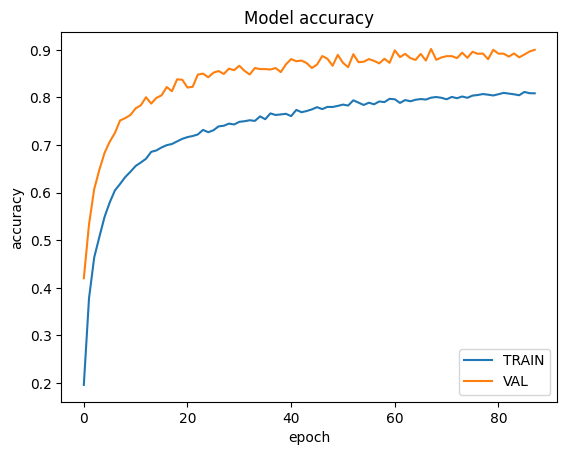

In [45]:
# Visualize the training history to see whether you're overfitting.
plt.plot(history.history["accuracy"])
plt.plot(history.history["val_accuracy"])
plt.title("Model accuracy")
plt.ylabel("accuracy")
plt.xlabel("epoch")
plt.legend(["TRAIN", "VAL"], loc="lower right")
plt.show()

In [46]:
# Evaluate the model using the TEST dataset

loss, accuracy = model.evaluate(X_test, y_test)
# model.save("model.keras")
# model = tf.keras.models.load_model("model.keras")

138/138 [==============================] - 0s 2ms/step - loss: 0.7109 - accuracy: 0.7772


138/138 [==============================] - 0s 2ms/step
Confusion matrix, without normalization

Classification Report:
               precision    recall  f1-score   support

         all       0.64      0.70      0.67       175
      before       0.85      0.83      0.84       253
       black       0.70      0.90      0.79       137
        book       0.74      0.95      0.83       310
       candy       0.63      0.92      0.75       222
       chair       0.93      0.64      0.75       200
     clothes       0.80      0.61      0.69       156
    computer       0.88      0.97      0.92       223
      cousin       0.90      1.00      0.95       214
        deaf       0.75      0.74      0.74       189
       drink       0.96      0.87      0.91       386
        fine       0.83      0.91      0.87       163
          go       0.34      0.49      0.40       131
        help       0.70      0.74      0.72       149
          no       1.00      0.08      0.15       236
        thin   

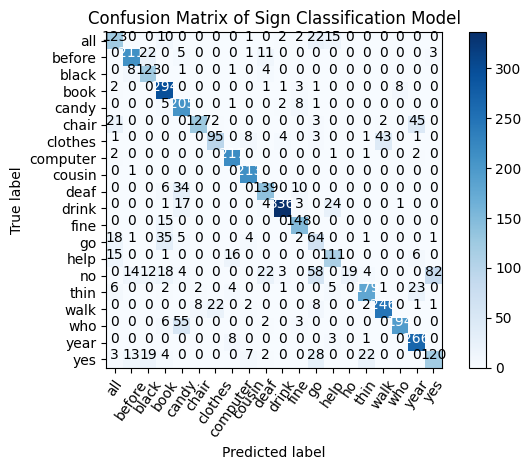

In [47]:
def plot_confusion_matrix(
    cm, classes, model, normalize=False, title="Confusion matrix", cmap=plt.cm.Blues
):
    """Plots the confusion matrix."""
    if normalize:
        cm = cm.astype("float") / cm.sum(axis=1)[:, np.newaxis]
        print("Normalized confusion matrix")
    else:
        print("Confusion matrix, without normalization")

    plt.imshow(cm, interpolation="nearest", cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=55)
    plt.yticks(tick_marks, classes)
    fmt = ".2f" if normalize else "d"
    thresh = cm.max() / 2.0
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(
            j,
            i,
            format(cm[i, j], fmt),
            horizontalalignment="center",
            color="white" if cm[i, j] > thresh else "black",
        )

    plt.ylabel("True label")
    plt.xlabel("Predicted label")
    plt.tight_layout()


# Classify pose in the TEST dataset using the trained model
y_pred = model.predict(X_test)

# Convert the prediction result to class name
y_pred_label = [class_names[i] for i in np.argmax(y_pred, axis=1)]
y_true_label = [class_names[i] for i in np.argmax(y_test, axis=1)]

# Plot the confusion matrix
cm = confusion_matrix(np.argmax(y_test, axis=1), np.argmax(y_pred, axis=1))
plot_confusion_matrix(
    cm, class_names, model, title="Confusion Matrix of Sign Classification Model"
)

# Print the classification report
print("\nClassification Report:\n", classification_report(y_true_label, y_pred_label))

# UTILS


In [48]:
# import os
# import sys

# pose_sample_rpi_path = os.path.join(
#     os.getcwd(), "examples/lite/examples/pose_estimation/raspberry_pi"
# )
# sys.path.append(pose_sample_rpi_path)
# import cv2
# import numpy as np
# import pandas as pd
# import tensorflow as tf
# import time
# import utils
# from data import BodyPart
# from ml import Movenet

# movenet = Movenet("movenet_thunder")
# class_names = np.array(
#     [
#         "all",
#         "before",
#         "black",
#         "book",
#         "candy",
#         "chair",
#         "clothes",
#         "computer",
#         "cousin",
#         "deaf",
#         "drink",
#         "fine",
#         "go",
#         "help",
#         "no",
#         "thin",
#         "walk",
#         "who",
#         "year",
#         "yes",
#     ]
# )

# model = tf.keras.models.load_model("model.keras")
# movenet = Movenet("movenet_thunder")


# def detect(input_tensor, inference_count=3):
#     """Runs detection on an input image.
#     Args:
#       input_tensor: A [height, width, 3] Tensor of type tf.float32.
#         Note that height and width can be anything since the image will be
#         immediately resized according to the needs of the model within this
#         function.
#       inference_count: Number of times the model should run repeatly on the
#         same input image to improve detection accuracy.

#     Returns:
#       A Person entity detected
#     """
#     channel, image_height, image_width = input_tensor.shape

#     # Detect pose using the full input image
#     movenet.detect(input_tensor.numpy(), reset_crop_region=True)

#     # Repeatedly using previous detection result to identify the region of
#     # interest and only croping that region to improve detection accuracy
#     for _ in range(inference_count - 1):
#         person = movenet.detect(input_tensor.numpy(), reset_crop_region=False)

#     return person


# def processTensorImage(path):
#     if type(path) == str:
#         image = tf.io.read_file(path)
#         image = tf.image.decode_jpeg(image)
#     else:
#         image = tf.convert_to_tensor(path, dtype=tf.float32)
#     return image


# def classifySign(image):
#     signs = {
#         "all": "All",
#         "before": "Before",
#         "black": "Black",
#         "book": "Book",
#         "candy": "Candy",
#         "chair": "Chair",
#         "clothes": "Clothes",
#         "computer": "Computer",
#         "cousin": "Cousin",
#         "deaf": "Deaf",
#         "drink": "Drink",
#         "fine": "Fine",
#         "go": "Go",
#         "help": "Help",
#         "no": "No",
#         "thin": "Thin",
#         "walk": "Walk",
#         "who": "Who",
#         "year": "Year",
#         "yes": "Yes",
#     }
#     image = processTensorImage(image)
#     person = detect(image)
#     sign_landmarks = np.array(
#         [
#             [keypoint.coordinate.x, keypoint.coordinate.y, keypoint.score]
#             for keypoint in person.keypoints
#         ],
#         dtype=np.float32,
#     )
#     coordinates = sign_landmarks.flatten().astype(str).tolist()
#     df = pd.DataFrame([coordinates]).reset_index(drop=True)
#     X = df.astype("float64").to_numpy()
#     y = model.predict(X)
#     y_pred = [class_names[i] for i in np.argmax(y, axis=1)]
#     return signs[y_pred[0]]

# USING IMAGE


In [49]:
# image_path = "Dataset\\computer\\007279.jpg"
# classifySign(image_path)

# USING VIDEO


In [50]:
# video_path = "c.mp4"

# # extract frames from a video and predict the sign in each frame
# cap = cv2.VideoCapture(video_path)
# frame_width = int(cap.get(3))
# frame_height = int(cap.get(4))
# out = cv2.VideoWriter(
#     "output.avi",
#     cv2.VideoWriter_fourcc("M", "J", "P", "G"),
#     10,
#     (frame_width, frame_height),
# )
# while True:
#     ret, frame = cap.read()
#     if not ret:
#         break
#     sign = classifySign(frame)
#     cv2.putText(frame, sign, (50, 50), cv2.FONT_HERSHEY_SIMPLEX, 1, (255, 255, 255), 2)
#     out.write(frame)

# cap.release()
# out.release()
# cv2.destroyAllWindows()

# REAL TIME


In [51]:
# camera_video = cv2.VideoCapture(0)
# camera_video.set(3, 1280)
# camera_video.set(4, 960)
# cv2.namedWindow("Sign Detection", cv2.WINDOW_NORMAL)
# while camera_video.isOpened():
#     ok, frame = camera_video.read()
#     time1 = time.time()
#     if not ok:
#         continue
#     gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
#     pose = classifySign(frame)
#     frame = cv2.flip(frame, 1)
#     time2 = time.time()
#     fps = 0
#     if (time2 - time1) > 0:
#         fps = 1.0 / (time2 - time1)
#     cv2.putText(
#         frame,
#         "FPS: {}".format(int(fps)),
#         (1100, 30),
#         cv2.FONT_HERSHEY_PLAIN,
#         3,
#         (0, 255, 0),
#         2,
#     )
#     cv2.putText(
#         frame, f"POSE: {pose}", (15, 30), cv2.FONT_HERSHEY_PLAIN, 3, (0, 255, 0), 2
#     )
#     time1 = time2

#     cv2.imshow("Sign Classification", frame)
#     k = cv2.waitKey(1) & 0xFF
#     if k == 27:
#         camera_video.release()
#         cv2.destroyAllWindows()
#         break
# camera_video.release()
# cv2.destroyAllWindows()

In [52]:
# %pip install -U imbalanced-learn
# !python --version
# !pip install tensorflow==2.15.0
# !pip install keras==2.15.0
# !pip show tensorflow
# !pip show keras
import os
import shutil
import pathlib
import PIL
import cv2
import time
import numpy as np
import tensorflow as tf
from tensorflow.keras.applications import EfficientNetB0
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
sns.set_style('whitegrid')
import random
import itertools
import matplotlib.pyplot as plt
from tensorflow.keras.utils import plot_model
from IPython.display import Image
# Plot and display architecture for InceptionV3 model
from tensorflow.keras.utils import plot_model
from IPython.display import Image

import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.callbacks import ModelCheckpoint
from tensorflow.keras.applications import ResNet50, DenseNet169, EfficientNetB3
from tensorflow.keras import Model
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import InputLayer, BatchNormalization, Dropout, Conv2D, MaxPooling2D, Flatten, Dense, Activation
from tensorflow .keras.optimizers import Adam, Adamax
from tensorflow.keras.metrics import categorical_crossentropy
from tensorflow.keras import regularizers
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.applications import InceptionV3
from tensorflow.keras.layers import GlobalAveragePooling2D, Dense
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam

from PIL import Image, UnidentifiedImageError

from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, classification_report

import warnings
warnings.filterwarnings("ignore")

import logging
logging.getLogger("tensorflow").setLevel(logging.ERROR)


print("All done")

All done


In [54]:
DIRECTORY = f"Dataset"

df = pd.DataFrame()

train_df = pd.DataFrame()
test_df = pd.DataFrame()

df["Paths"] = [
    os.path.join(DIRECTORY, label, image)
    for label in os.listdir(DIRECTORY)
    for image in os.listdir(os.path.join(DIRECTORY, label))
]
df["Labels"] = [
    label
    for label in os.listdir(DIRECTORY)
    for image in os.listdir(os.path.join(DIRECTORY, label))
]

In [55]:
from sklearn.model_selection import train_test_split

# Splitting the dataframe into training and testing/validation sets
train_images, test_images, train_labels, test_labels = train_test_split(
    df["Paths"], df["Labels"], test_size=0.2, random_state=42
)

# Further splitting the test set into testing and validation sets
test_images, val_images, test_labels, val_labels = train_test_split(
    test_images, test_labels, test_size=0.5, random_state=42
)

# Creating dataframes for training, testing, and validation sets
train_df = pd.DataFrame({"Paths": train_images, "Labels": train_labels})
test_df = pd.DataFrame({"Paths": test_images, "Labels": test_labels})
val_df = pd.DataFrame({"Paths": val_images, "Labels": val_labels})

In [56]:
train_df.to_csv("train.csv", index=False)
test_df.to_csv("test.csv", index=False)
val_df.to_csv("valid.csv", index=False)

## 1. Splitting the data into training, and testing sets


In [57]:
# train, valid  and test dataframes
train = pd.read_csv(f"train.csv")
valid = pd.read_csv(f"valid.csv")
test = pd.read_csv(f"test.csv")

train.Labels.value_counts()

Labels
drink       1547
book        1216
walk        1156
year        1127
who         1049
before      1048
no           918
thin         899
candy        891
computer     878
yes          877
cousin       877
chair        773
deaf         764
all          718
fine         664
clothes      626
help         613
black        533
go           510
Name: count, dtype: int64

## 2. Data Augmentation


In [58]:
batch_size = 40
img_size = (224, 224)
channels = 3
img_shape = (img_size[0], img_size[1], channels)


# Create generators

tr_G = ImageDataGenerator(
    zca_whitening=True,
    rotation_range=30.0,
    fill_mode="nearest",
)

V_G = ImageDataGenerator()
t_G = ImageDataGenerator()

# Generate Appropriate Data for fitting into model

Train = tr_G.flow_from_dataframe(
    train,
    x_col="Paths",
    y_col="Labels",
    target_size=img_size,
    class_mode="categorical",
    color_mode="rgb",
    shuffle=True,
    batch_size=batch_size,
)
Valid = V_G.flow_from_dataframe(
    valid,
    x_col="Paths",
    y_col="Labels",
    target_size=img_size,
    class_mode="categorical",
    color_mode="rgb",
    shuffle=True,
    batch_size=batch_size,
)
Test = t_G.flow_from_dataframe(
    test,
    x_col="Paths",
    y_col="Labels",
    target_size=img_size,
    class_mode="categorical",
    color_mode="rgb",
    shuffle=False,
    batch_size=batch_size,
)

Found 17684 validated image filenames belonging to 20 classes.
Found 2211 validated image filenames belonging to 20 classes.
Found 2211 validated image filenames belonging to 20 classes.


In [59]:
# Define number of classes
num_classes = len(list(Train.class_indices.keys()))
img_shape = (img_size[0], img_size[1], 3)
EPOCHS = 15
early_stopping = EarlyStopping(
    monitor="val_loss", patience=5, restore_best_weights=True
)

# EfficientNetB0


In [ ]:
import numpy as np
import tensorflow as tf
from tensorflow.keras.applications import EfficientNetB0
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.layers import GlobalAveragePooling2D, Dense
from tensorflow.keras.models import Model


def create_model():
    pretrained_model = EfficientNetB0(
        include_top=False, weights="imagenet", input_shape=(img_size[0], img_size[1], 3)
    )
    pretrained_model.trainable = True

    # Add custom head
    x = GlobalAveragePooling2D()(pretrained_model.output)
    x = Dense(512, activation="relu")(x)
    predictions = Dense(num_classes, activation="softmax")(x)

    # Create model
    EfficientNetB0_model = Model(inputs=pretrained_model.input, outputs=predictions)

    # Compile model
    EfficientNetB0_model.compile(
        optimizer=Adam(), loss="categorical_crossentropy", metrics=["accuracy"]
    )

    return EfficientNetB0_model


EfficientNetB0_model = create_model()

In [ ]:
EfficientNetB0_model.summary()

Model: "model_1"

__________________________________________________________________________________________________

 Layer (type)                Output Shape                 Param #   Connected to                  


 input_2 (InputLayer)        [(None, 224, 224, 3)]        0         []                            

                                                                                                  

 rescaling (Rescaling)       (None, 224, 224, 3)          0         ['input_2[0][0]']             

                                                                                                  

 normalization (Normalizati  (None, 224, 224, 3)          7         ['rescaling[0][0]']           

 on)                                                                                              

                                                                                                  

 rescaling_1 (Rescaling)     (None, 224, 224, 3)          0         ['normalizati

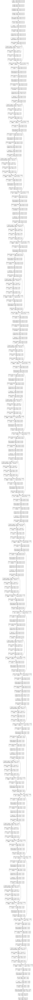

In [ ]:
# Plot and display architecture for EfficientNetB0 model
from tensorflow.keras.utils import plot_model
from IPython.display import Image

plot_model(
    EfficientNetB0_model,
    to_file="EfficientNetB0_model.png",
    show_shapes=True,
    show_layer_names=True,
)
Image(filename="EfficientNetB0_model.png")

## Training the model


In [ ]:
history_EfficientNetB0 = EfficientNetB0_model.fit(
    Train,
    steps_per_epoch=Train.samples // batch_size,
    epochs=EPOCHS,
    validation_data=Valid,
    validation_steps=Valid.samples // batch_size,
    verbose=1,
)

# Evaluate the model on the test set
test_loss_efficientnetb0, test_accuracy_efficientnetb0 = EfficientNetB0_model.evaluate(
    Test
)

Epoch 1/15

442/442 [==============================] - 1396s 3s/step - loss: 0.1745 - accuracy: 0.9507 - val_loss: 0.0074 - val_accuracy: 0.9968

Epoch 2/15

442/442 [==============================] - 1202s 3s/step - loss: 0.0361 - accuracy: 0.9904 - val_loss: 0.0170 - val_accuracy: 0.9936

Epoch 3/15

442/442 [==============================] - 1205s 3s/step - loss: 0.0444 - accuracy: 0.9878 - val_loss: 0.0236 - val_accuracy: 0.9941

Epoch 4/15

442/442 [==============================] - 1268s 3s/step - loss: 0.0183 - accuracy: 0.9948 - val_loss: 0.0031 - val_accuracy: 0.9991

Epoch 5/15

442/442 [==============================] - 1262s 3s/step - loss: 0.0234 - accuracy: 0.9949 - val_loss: 0.0084 - val_accuracy: 0.9968

Epoch 6/15

442/442 [==============================] - 1211s 3s/step - loss: 0.0166 - accuracy: 0.9954 - val_loss: 0.1446 - val_accuracy: 0.9614

Epoch 7/15

442/442 [==============================] - 1174s 3s/step - loss: 0.0196 - accuracy: 0.9953 - val_loss: 0.0104 - 

In [ ]:
tr_acc_EfficientNetB0 = history_EfficientNetB0.history["accuracy"]
tr_loss_EfficientNetB0 = history_EfficientNetB0.history["loss"]
v_acc_EfficientNetB0 = history_EfficientNetB0.history["val_accuracy"]
v_loss_EfficientNetB0 = history_EfficientNetB0.history["val_loss"]
index_acc_EfficientNetB0 = np.argmax(v_acc_EfficientNetB0)
high_Vacc_EfficientNetB0 = v_acc_EfficientNetB0[index_acc_EfficientNetB0]
index_loss_EfficientNetB0 = np.argmin(v_loss_EfficientNetB0)
low_Vloss_EfficientNetB0 = v_loss_EfficientNetB0[index_loss_EfficientNetB0]
Epochs_EfficientNetB0 = list(range(1, len(tr_acc_EfficientNetB0) + 1))
best_acc_EfficientNetB0 = f"Best epoch ={str(index_acc_EfficientNetB0 + 1)}"
best_loss_EfficientNetB0 = f"Best epoch ={str(index_loss_EfficientNetB0 + 1)}"

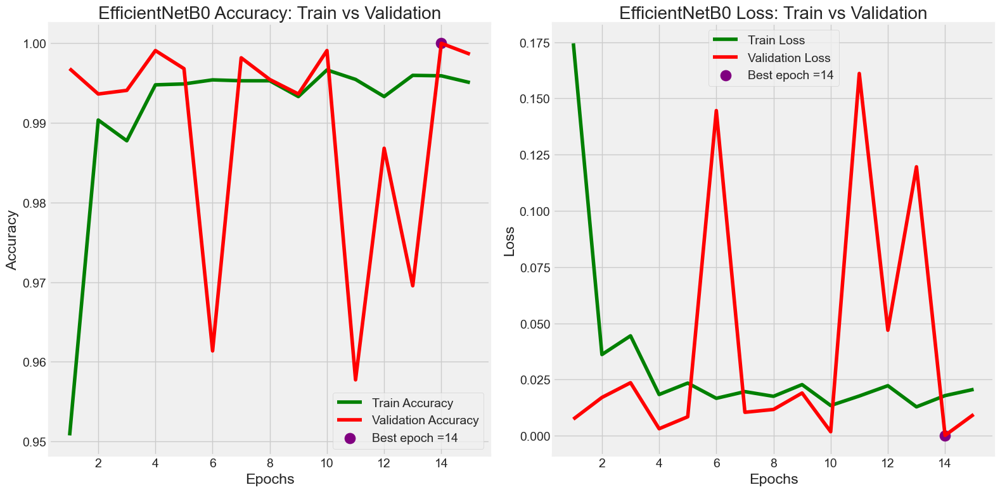

In [ ]:
# Plotting for EfficientNetB0B3 model
plt.figure(figsize=(16, 8))
plt.style.use("fivethirtyeight")

plt.subplot(1, 2, 1)
plt.plot(Epochs_EfficientNetB0, tr_acc_EfficientNetB0, "g", label="Train Accuracy")
plt.plot(Epochs_EfficientNetB0, v_acc_EfficientNetB0, "r", label="Validation Accuracy")
plt.scatter(
    index_acc_EfficientNetB0 + 1,
    high_Vacc_EfficientNetB0,
    s=150,
    color="purple",
    label=best_acc_EfficientNetB0,
)
plt.title("EfficientNetB0 Accuracy: Train vs Validation")
plt.xlabel("Epochs")
plt.ylabel("Accuracy")
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(Epochs_EfficientNetB0, tr_loss_EfficientNetB0, "g", label="Train Loss")
plt.plot(Epochs_EfficientNetB0, v_loss_EfficientNetB0, "r", label="Validation Loss")
plt.scatter(
    index_loss_EfficientNetB0 + 1,
    low_Vloss_EfficientNetB0,
    s=150,
    color="purple",
    label=best_loss_EfficientNetB0,
)
plt.title("EfficientNetB0 Loss: Train vs Validation")
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.legend()

plt.tight_layout()
plt.show()

In [ ]:
# save the model
EfficientNetB0_model.save(f"models//EfficientNetB0_model.keras")
# save the history of the model
np.save(f"models//EfficientNetB0_model_history.npy", history_EfficientNetB0.history)

import pickle

with open(f"models//history_EfficientNetB0.pickle", "wb") as handle:
    pickle.dump(
        history_EfficientNetB0.history, handle, protocol=pickle.HIGHEST_PROTOCOL
    )

# ResNet50


In [17]:
from tensorflow.keras.applications import ResNet50

np.random.seed(42)
# Define base model
base_model = ResNet50(
    include_top=False, weights="imagenet", input_shape=(img_size[0], img_size[1], 3)
)

# Add custom head
x = GlobalAveragePooling2D()(base_model.output)
x = Dense(512, activation="relu")(x)
predictions = Dense(num_classes, activation="softmax")(x)

# Create model
ResNet50_model = Model(inputs=base_model.input, outputs=predictions)

# Compile model
ResNet50_model.compile(
    optimizer=Adam(), loss="categorical_crossentropy", metrics=["accuracy"]
)

94765736/94765736 [==============================] - 1s 0us/step


In [18]:
ResNet50_model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 224, 224, 3)]        0         []                            
                                                                                                  
 conv1_pad (ZeroPadding2D)   (None, 230, 230, 3)          0         ['input_1[0][0]']             
                                                                                                  
 conv1_conv (Conv2D)         (None, 112, 112, 64)         9472      ['conv1_pad[0][0]']           
                                                                                                  
 conv1_bn (BatchNormalizati  (None, 112, 112, 64)         256       ['conv1_conv[0][0]']          
 on)                                                                                          

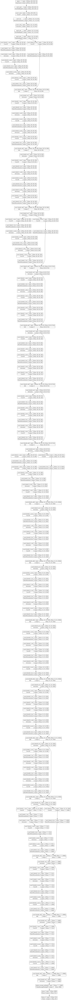

In [19]:
# Plot and display architecture for ResNet50 model
from tensorflow.keras.utils import plot_model
from IPython.display import Image

plot_model(
    ResNet50_model,
    to_file="ResNet50_model.png",
    show_shapes=True,
    show_layer_names=True,
)
Image(filename="ResNet50_model.png")

In [20]:
np.random.seed(42)
# Train the model
history_ResNet50 = ResNet50_model.fit(
    Train,
    steps_per_epoch=Train.samples // batch_size,
    epochs=EPOCHS,
    validation_data=Valid,
    validation_steps=Valid.samples // batch_size,
    verbose=1,
)

# Evaluate the model on the test set
test_loss_resnet50, test_accuracy_resnet50 = ResNet50_model.evaluate(Test)

Epoch 1/15


I0000 00:00:1712928338.041863     119 device_compiler.h:186] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


442/442 [==============================] - 369s 742ms/step - loss: 0.3413 - accuracy: 0.8997 - val_loss: 3.3968 - val_accuracy: 0.5332
Epoch 2/15
442/442 [==============================] - 269s 608ms/step - loss: 0.0387 - accuracy: 0.9882 - val_loss: 0.5243 - val_accuracy: 0.8477
Epoch 3/15
442/442 [==============================] - 271s 612ms/step - loss: 0.0427 - accuracy: 0.9857 - val_loss: 2.6676 - val_accuracy: 0.6000
Epoch 4/15
442/442 [==============================] - 279s 630ms/step - loss: 0.0283 - accuracy: 0.9914 - val_loss: 5.9052 - val_accuracy: 0.2655
Epoch 5/15
442/442 [==============================] - 273s 616ms/step - loss: 0.0240 - accuracy: 0.9934 - val_loss: 0.1747 - val_accuracy: 0.9445
Epoch 6/15
442/442 [==============================] - 270s 611ms/step - loss: 0.0301 - accuracy: 0.9911 - val_loss: 0.3859 - val_accuracy: 0.8877
Epoch 7/15
442/442 [==============================] - 272s 615ms/step - loss: 0.0184 - accuracy: 0.9944 - val_loss: 0.0947 - val_accura

In [21]:
tr_acc_ResNet50 = history_ResNet50.history["accuracy"]
tr_loss_ResNet50 = history_ResNet50.history["loss"]
v_acc_ResNet50 = history_ResNet50.history["val_accuracy"]
v_loss_ResNet50 = history_ResNet50.history["val_loss"]
index_acc_ResNet50 = np.argmax(v_acc_ResNet50)
high_Vacc_ResNet50 = v_acc_ResNet50[index_acc_ResNet50]
index_loss_ResNet50 = np.argmin(v_loss_ResNet50)`
low_Vloss_ResNet50 = v_loss_ResNet50[index_loss_ResNet50]
Epochs_ResNet50 = list(range(1, len(tr_acc_ResNet50) + 1))
best_acc_ResNet50 = f"Best epoch ={str(index_acc_ResNet50 + 1)}"
best_loss_ResNet50 = f"Best epoch ={str(index_loss_ResNet50 + 1)}"

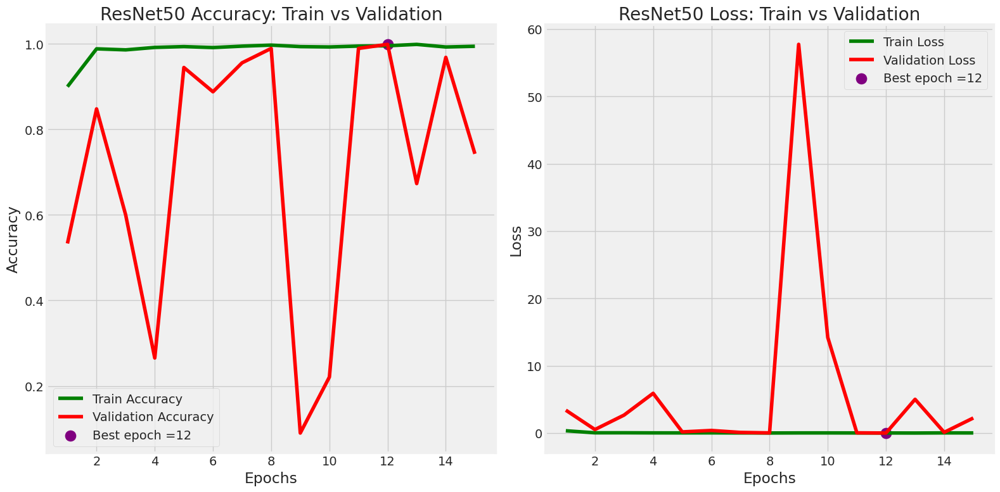

In [22]:
# Plotting for ResNet50 model
plt.figure(figsize=(16, 8))
plt.style.use("fivethirtyeight")

plt.subplot(1, 2, 1)
plt.plot(Epochs_ResNet50, tr_acc_ResNet50, "g", label="Train Accuracy")
plt.plot(Epochs_ResNet50, v_acc_ResNet50, "r", label="Validation Accuracy")
plt.scatter(
    index_acc_ResNet50 + 1,
    high_Vacc_ResNet50,
    s=150,
    color="purple",
    label=best_acc_ResNet50,
)
plt.title("ResNet50 Accuracy: Train vs Validation")
plt.xlabel("Epochs")
plt.ylabel("Accuracy")
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(Epochs_ResNet50, tr_loss_ResNet50, "g", label="Train Loss")
plt.plot(Epochs_ResNet50, v_loss_ResNet50, "r", label="Validation Loss")
plt.scatter(
    index_loss_ResNet50 + 1,
    low_Vloss_ResNet50,
    s=150,
    color="purple",
    label=best_loss_ResNet50,
)
plt.title("ResNet50 Loss: Train vs Validation")
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.legend()

plt.tight_layout()
plt.show()

In [24]:
# save the model
ResNet50_model.save(f"/kaggle/working/ResNet50_model.keras")
ResNet50_model.save(f"/kaggle/working/ResNet50_model.h5")
ResNet50_model.save(f"/kaggle/working/ResNet50_model.hd5")
# save the history of the model
np.save(f"/kaggle/working/ResNet50_model_history.npy", history_ResNet50.history)

import pickle

with open(f"/kaggle/working/history_ResNet50.pickle", "wb") as handle:
    pickle.dump(history_ResNet50.history, handle, protocol=pickle.HIGHEST_PROTOCOL)

# DenseNet169


In [25]:
from tensorflow.keras.applications import DenseNet169

# Define base model
base_model = DenseNet169(
    include_top=False, weights="imagenet", input_shape=(img_size[0], img_size[1], 3)
)

# Add custom head
x = GlobalAveragePooling2D()(base_model.output)
x = Dense(512, activation="relu")(x)
predictions = Dense(num_classes, activation="softmax")(x)

# Create model
DenseNet169_model = Model(inputs=base_model.input, outputs=predictions)

# Compile model
DenseNet169_model.compile(
    optimizer=Adam(), loss="categorical_crossentropy", metrics=["accuracy"]
)

51877672/51877672 [==============================] - 0s 0us/step


In [26]:
DenseNet169_model.summary()

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_2 (InputLayer)        [(None, 224, 224, 3)]        0         []                            
                                                                                                  
 zero_padding2d (ZeroPaddin  (None, 230, 230, 3)          0         ['input_2[0][0]']             
 g2D)                                                                                             
                                                                                                  
 conv1/conv (Conv2D)         (None, 112, 112, 64)         9408      ['zero_padding2d[0][0]']      
                                                                                                  
 conv1/bn (BatchNormalizati  (None, 112, 112, 64)         256       ['conv1/conv[0][0]']    

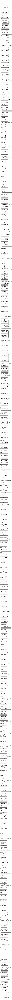

In [27]:
# Plot and display architecture for DenseNet169 model

from tensorflow.keras.utils import plot_model
from IPython.display import Image

plot_model(
    DenseNet169_model,
    to_file="DenseNet169_model.png",
    show_shapes=True,
    show_layer_names=True,
)
Image(filename="DenseNet169_model.png")

In [28]:
np.random.seed(42)
# Train the model
history_DenseNet169 = DenseNet169_model.fit(
    Train,
    steps_per_epoch=Train.samples // batch_size,
    epochs=EPOCHS,
    validation_data=Valid,
    validation_steps=Valid.samples // batch_size,
    verbose=1,
)

# Evaluate the model on the test set
test_loss_densenet169, test_accuracy_densenet169 = DenseNet169_model.evaluate(Test)

Epoch 1/15
442/442 [==============================] - 400s 672ms/step - loss: 0.2082 - accuracy: 0.9384 - val_loss: 0.8065 - val_accuracy: 0.8155
Epoch 2/15
442/442 [==============================] - 278s 627ms/step - loss: 0.0723 - accuracy: 0.9772 - val_loss: 12.9900 - val_accuracy: 0.1132
Epoch 3/15
442/442 [==============================] - 276s 622ms/step - loss: 0.0443 - accuracy: 0.9870 - val_loss: 0.0068 - val_accuracy: 0.9973
Epoch 4/15
442/442 [==============================] - 273s 617ms/step - loss: 0.0496 - accuracy: 0.9859 - val_loss: 5.5383 - val_accuracy: 0.4077
Epoch 5/15
442/442 [==============================] - 273s 617ms/step - loss: 0.0567 - accuracy: 0.9835 - val_loss: 0.0328 - val_accuracy: 0.9895
Epoch 6/15
442/442 [==============================] - 271s 613ms/step - loss: 0.0196 - accuracy: 0.9942 - val_loss: 8.0603 - val_accuracy: 0.2514
Epoch 7/15
442/442 [==============================] - 278s 628ms/step - loss: 0.0298 - accuracy: 0.9911 - val_loss: 1.7997 

In [29]:
tr_acc_DenseNet169 = history_DenseNet169.history["accuracy"]
tr_loss_DenseNet169 = history_DenseNet169.history["loss"]
v_acc_DenseNet169 = history_DenseNet169.history["val_accuracy"]
v_loss_DenseNet169 = history_DenseNet169.history["val_loss"]
index_acc_DenseNet169 = np.argmax(v_acc_DenseNet169)
high_Vacc_DenseNet169 = v_acc_DenseNet169[index_acc_DenseNet169]
index_loss_DenseNet169 = np.argmin(v_loss_DenseNet169)
low_Vloss_DenseNet169 = v_loss_DenseNet169[index_loss_DenseNet169]
Epochs_DenseNet169 = list(range(1, len(tr_acc_DenseNet169) + 1))
best_acc_DenseNet169 = f"Best epoch ={str(index_acc_DenseNet169 + 1)}"
best_loss_DenseNet169 = f"Best epoch ={str(index_loss_DenseNet169 + 1)}"

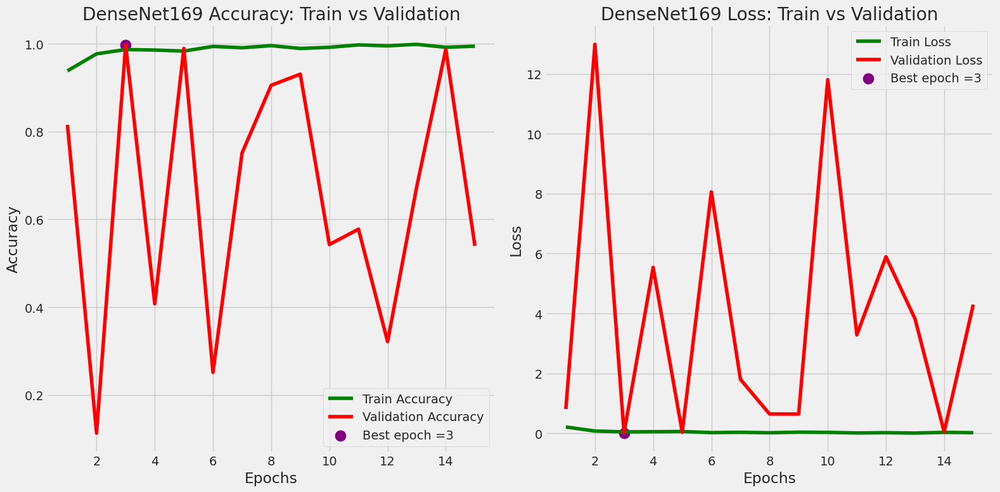

In [30]:
# Plotting for DenseNet169 model
plt.figure(figsize=(16, 8))
plt.style.use("fivethirtyeight")

plt.subplot(1, 2, 1)
plt.plot(Epochs_DenseNet169, tr_acc_DenseNet169, "g", label="Train Accuracy")
plt.plot(Epochs_DenseNet169, v_acc_DenseNet169, "r", label="Validation Accuracy")
plt.scatter(
    index_acc_DenseNet169 + 1,
    high_Vacc_DenseNet169,
    s=150,
    color="purple",
    label=best_acc_DenseNet169,
)
plt.title("DenseNet169 Accuracy: Train vs Validation")
plt.xlabel("Epochs")
plt.ylabel("Accuracy")
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(Epochs_DenseNet169, tr_loss_DenseNet169, "g", label="Train Loss")
plt.plot(Epochs_DenseNet169, v_loss_DenseNet169, "r", label="Validation Loss")
plt.scatter(
    index_loss_DenseNet169 + 1,
    low_Vloss_DenseNet169,
    s=150,
    color="purple",
    label=best_loss_DenseNet169,
)
plt.title("DenseNet169 Loss: Train vs Validation")
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.legend()

plt.tight_layout()
plt.show()

In [31]:
# save the model
DenseNet169_model.save(f"/kaggle/working/DenseNet169_model.keras")
DenseNet169_model.save(f"/kaggle/working/DenseNet169_model.h5")
DenseNet169_model.save(f"/kaggle/working/DenseNet169_model.hd5")
# save the history of the model
np.save(f"/kaggle/working/DenseNet169_model_history.npy", history_DenseNet169.history)

import pickle

with open(f"/kaggle/working/history_DenseNet169.pickle", "wb") as handle:
    pickle.dump(history_DenseNet169.history, handle, protocol=pickle.HIGHEST_PROTOCOL)

# InceptionV3


In [32]:
from tensorflow.keras.applications import InceptionV3
from tensorflow.keras.layers import GlobalAveragePooling2D, Dense
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam

base_model = InceptionV3(
    include_top=False, weights="imagenet", input_shape=(img_size[0], img_size[1], 3)
)
x = GlobalAveragePooling2D()(base_model.output)
x = Dense(512, activation="relu")(x)
predictions = Dense(num_classes, activation="softmax")(x)

InceptionV3_model = Model(inputs=base_model.input, outputs=predictions)
InceptionV3_model.compile(
    optimizer=Adam(), loss="categorical_crossentropy", metrics=["accuracy"]
)

87910968/87910968 [==============================] - 0s 0us/step


In [33]:
InceptionV3_model.summary()

Model: "model_2"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_3 (InputLayer)        [(None, 224, 224, 3)]        0         []                            
                                                                                                  
 conv2d (Conv2D)             (None, 111, 111, 32)         864       ['input_3[0][0]']             
                                                                                                  
 batch_normalization (Batch  (None, 111, 111, 32)         96        ['conv2d[0][0]']              
 Normalization)                                                                                   
                                                                                                  
 activation (Activation)     (None, 111, 111, 32)         0         ['batch_normalization[0]

In [34]:
# Plot and display architecture for InceptionV3 model
from tensorflow.keras.utils import plot_model
from IPython.display import Image


plot_model(
    InceptionV3_model,
    to_file="InceptionV3_model.png",
    show_shapes=True,
    show_layer_names=True,
)
Image(filename="InceptionV3_model.png")

In [35]:
np.random.seed(42)
history_inception = InceptionV3_model.fit(
    Train,
    steps_per_epoch=Train.samples // batch_size,
    epochs=EPOCHS,
    validation_data=Valid,
    validation_steps=Valid.samples // batch_size,
    verbose=1,
)

Epoch 1/15
442/442 [==============================] - 347s 691ms/step - loss: 0.3796 - accuracy: 0.8876 - val_loss: 2.1962 - val_accuracy: 0.6432
Epoch 2/15
442/442 [==============================] - 288s 650ms/step - loss: 0.0701 - accuracy: 0.9815 - val_loss: 0.0602 - val_accuracy: 0.9791
Epoch 3/15
442/442 [==============================] - 272s 614ms/step - loss: 0.0592 - accuracy: 0.9826 - val_loss: 0.3455 - val_accuracy: 0.9295
Epoch 4/15
442/442 [==============================] - 280s 632ms/step - loss: 0.0760 - accuracy: 0.9801 - val_loss: 0.6777 - val_accuracy: 0.8859
Epoch 5/15
442/442 [==============================] - 279s 632ms/step - loss: 0.0476 - accuracy: 0.9865 - val_loss: 0.0639 - val_accuracy: 0.9800
Epoch 6/15
442/442 [==============================] - 269s 607ms/step - loss: 0.0347 - accuracy: 0.9907 - val_loss: 0.0327 - val_accuracy: 0.9900
Epoch 7/15
442/442 [==============================] - 268s 606ms/step - loss: 0.0225 - accuracy: 0.9935 - val_loss: 15.7142 

In [36]:
test_loss_inception, test_accuracy_inception = InceptionV3_model.evaluate(Test)

56/56 [==============================] - 14s 245ms/step - loss: 0.0959 - accuracy: 0.9665


In [37]:
tr_acc_InceptionV3 = history_inception.history["accuracy"]
tr_loss_InceptionV3 = history_inception.history["loss"]
v_acc_InceptionV3 = history_inception.history["val_accuracy"]
v_loss_InceptionV3 = history_inception.history["val_loss"]
index_acc_InceptionV3 = np.argmax(v_acc_InceptionV3)
high_Vacc_InceptionV3 = v_acc_InceptionV3[index_acc_InceptionV3]
index_loss_InceptionV3 = np.argmin(v_loss_InceptionV3)
low_Vloss_InceptionV3 = v_loss_InceptionV3[index_loss_InceptionV3]
Epochs_InceptionV3 = list(range(1, len(tr_acc_InceptionV3) + 1))
best_acc_InceptionV3 = f"Best epoch ={str(index_acc_InceptionV3 + 1)}"
best_loss_InceptionV3 = f"Best epoch ={str(index_loss_InceptionV3 + 1)}"

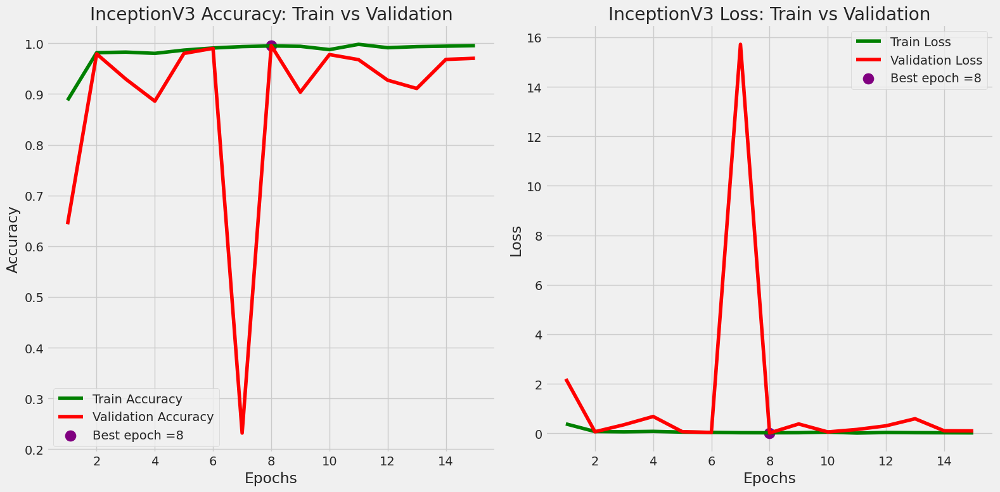

In [38]:
# Plotting for InceptionV3 model
plt.figure(figsize=(16, 8))
plt.style.use("fivethirtyeight")

plt.subplot(1, 2, 1)
plt.plot(Epochs_InceptionV3, tr_acc_InceptionV3, "g", label="Train Accuracy")
plt.plot(Epochs_InceptionV3, v_acc_InceptionV3, "r", label="Validation Accuracy")
plt.scatter(
    index_acc_InceptionV3 + 1,
    high_Vacc_InceptionV3,
    s=150,
    color="purple",
    label=best_acc_InceptionV3,
)
plt.title("InceptionV3 Accuracy: Train vs Validation")
plt.xlabel("Epochs")
plt.ylabel("Accuracy")
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(Epochs_InceptionV3, tr_loss_InceptionV3, "g", label="Train Loss")
plt.plot(Epochs_InceptionV3, v_loss_InceptionV3, "r", label="Validation Loss")
plt.scatter(
    index_loss_InceptionV3 + 1,
    low_Vloss_InceptionV3,
    s=150,
    color="purple",
    label=best_loss_InceptionV3,
)
plt.title("InceptionV3 Loss: Train vs Validation")
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.legend()

plt.tight_layout()
plt.show()

In [39]:
# save the model
InceptionV3_model.save(f"InceptionV3_model.keras")
InceptionV3_model.save(f"InceptionV3_model.h5")
InceptionV3_model.save(f"InceptionV3_model.hd5")
# save the history of the model
np.save(f"InceptionV3_model_history.npy", history_inception.history)

import pickle

with open(f"history_inception.pickle", "wb") as handle:
    pickle.dump(history_inception.history, handle, protocol=pickle.HIGHEST_PROTOCOL)

# Loading the models


In [60]:
import tensorflow as tf

model_dnn = tf.keras.models.load_model("models\\model.keras")
InceptionV3_model = keras.models.load_model("models\\InceptionV3_model.h5")
ResNet50_model = keras.models.load_model("models\\ResNet50_model.h5")
DenseNet169_model = keras.models.load_model("models\\DenseNet169_model.h5")
EfficientNetB0_model = keras.models.load_model("models\\EfficientNetB0_model.keras")

In [64]:
models = {
    "Hybrid Model": model,
    "Inception": InceptionV3_model,
    "ResNet": ResNet50_model,
    "DenseNet": DenseNet169_model,
    "EfficientNetB0": EfficientNetB0_model,
}

# Dictionary to store test results for each model
test_results = {}

# Loop through each model and evaluate it
for model_name, model in models.items():
    if model_name == "Hybrid Model":
        continue
    # Evaluate the model
    scores = model.evaluate(Test, verbose=1)

    # Store test results in the dictionary
    test_results[model_name] = {"accuracy": scores[1], "loss": scores[0]}

loss, accuracy = model_dnn.evaluate(X_test, y_test)
test_results["Hybrid Model"] = {"accuracy": accuracy, "loss": loss}
# Print test metrics for each model
for model_name, metrics in test_results.items():
    print(f"\n\n{model_name} Test Metrics:")
    print("  Accuracy:", metrics["accuracy"])
    print("  Loss:", metrics["loss"])

138/138 [==============================] - 1s 2ms/step - loss: 0.5867 - accuracy: 0.8056


Inception Test Metrics:
  Accuracy: 0.9787426590919495
  Loss: 0.0884217917919159


ResNet Test Metrics:
  Accuracy: 0.734509289264679
  Loss: 2.3788583278656006


DenseNet Test Metrics:
  Accuracy: 0.5323383212089539
  Loss: 4.452730655670166


EfficientNetB0 Test Metrics:
  Accuracy: 0.9995477199554443
  Loss: 0.002204260556027293


Hybrid Model Test Metrics:
  Accuracy: 0.8055744171142578
  Loss: 0.5866916179656982


In [65]:
# Evaluate each model on the test set
test_accs = {
    "Hybrid Model": model.evaluate(Test)[1],
    "InceptionV3_model": InceptionV3_model.evaluate(Test)[1],
    "ResNet50_model": ResNet50_model.evaluate(Test)[1],
    "DenseNet169_model": DenseNet169_model.evaluate(Test)[1],
    "EfficientNetB0_model": EfficientNetB0_model.evaluate(Test)[1],
}

56/56 [==============================] - 34s 609ms/step - loss: 0.0022 - accuracy: 0.9995


In [67]:
# Print results
best_model_name = max(test_accs, key=test_accs.get)
best_test_accuracy = test_accs[best_model_name]
print("Test Accuracies:")
for model_name, test_acc in test_accs.items():
    print(model_name + ":", test_acc)
print("\nBest Model Based on Test Accuracy:", best_model_name)
print("Test Accuracy of Best Model:", best_test_accuracy)

Test Accuracies:
Hybrid Model: 0.9995477199554443
InceptionV3_model: 0.9787426590919495
ResNet50_model: 0.734509289264679
DenseNet169_model: 0.5323383212089539
EfficientNetB0_model: 0.9995477199554443

Best Model Based on Test Accuracy: Hybrid Model
Test Accuracy of Best Model: 0.9995477199554443


In [68]:
from sklearn.metrics import confusion_matrix
import itertools

classes = list(Test.class_indices.keys())


# Function to plot confusion matrix
def plot_confusion_matrix(cm, classes, title="Confusion Matrix", cmap=plt.cm.Greens):
    plt.figure(figsize=(8, 8))
    plt.imshow(cm, interpolation="nearest", cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)
    thresh = cm.max() / 2.0
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(
            j,
            i,
            cm[i, j],
            horizontalalignment="center",
            color="white" if cm[i, j] > thresh else "red",
        )
    plt.tight_layout()
    plt.xlabel("Predictions")
    plt.ylabel("Real Values")
    plt.show()

In [69]:
models = {
    model: "Hybrid Model",
    InceptionV3_model: "InceptionV3",
    ResNet50_model: "ResNet50",
    DenseNet169_model: "DenseNet169",
    EfficientNetB0_model: "EfficientNetB0",
}

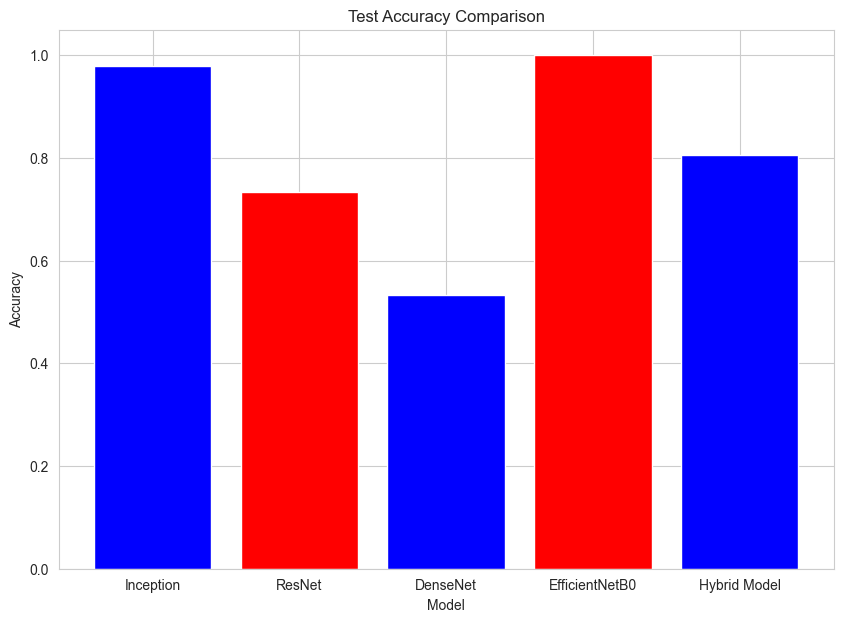

In [70]:
accuracies = [test_results[model_name]["accuracy"] for model_name in test_results]
model_names = list(test_results.keys())

# Create a bar plot
plt.figure(figsize=(10, 7))
plt.bar(model_names, accuracies, color=["blue", "red"])
plt.title("Test Accuracy Comparison")
plt.xlabel("Model")
plt.ylabel("Accuracy")
plt.show()